In [34]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [44]:
import pickle
import matplotlib.pyplot as plt
import numpy as np
import os
import seaborn as sns
import pandas as pd
from PIL import Image
from natsort import natsorted
from termcolor import colored

In [37]:
# Display pandas df without truncation
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

np.set_printoptions(edgeitems=30, linewidth=100000, formatter=dict(float=lambda x: "%.3g" % x))

In [38]:
# colors = ['red','blue','darkgreen','crimson','turquoise', 'khaki','navy', 'orangered', 'sienna']
Ncolors = 9
colormap = plt.cm.viridis  # LinearSegmentedColormap
Ncolors = min(colormap.N, Ncolors)
mapcolors = [colormap(int(x * colormap.N / Ncolors)) for x in range(Ncolors)]

In [39]:
with open('total_experiment.pkl', 'rb') as f:
    experiment = pickle.load(f)
with open('total_baseline.pkl', 'rb') as f:
    baseline = pickle.load(f)

In [40]:
len(experiment[2])

180

In [32]:
def plot_both_wmsd(base_matrix, total_wmsd_matrix, alpha='1.2', rho='0.0', num_robots='10', msd_type='fixed'):
    fig = plt.figure(figsize=(20, 10), dpi=160, facecolor='w', edgecolor='k')
    plt.grid()

    if msd_type == 'time_msd':
        times = np.arange(len(total_wmsd_matrix[0])) * 10
        plt.plot(times, total_wmsd_matrix[0], label='TMSD', marker='o', color=mapcolors[0])
        plt.plot(times, base_matrix[0], label="Baseline", linestyle='dashed', alpha=0.6, color=mapcolors[0])
        fig.legend(loc=7, bbox_to_anchor=(0.97, 0.5))
        plt.ylim(bottom=0.0, top=total_wmsd_matrix[0].max() + 0.5)

    else:
        for i, y in enumerate(total_wmsd_matrix):
            if msd_type == 'windowed':
                times = np.arange(len(y)) * 10
            else:
                times = np.linspace(0, len(y) * (i + 1) * 10, len(y), endpoint=True)

            plt.plot(times, y, label=i + 1, marker='o', color=mapcolors[i])

        for i, y in enumerate(base_matrix):
            if msd_type == 'windowed':
                times = np.arange(len(y)) * 10
            else:
                times = np.linspace(0, len(y) * (i + 1) * 10, len(y), endpoint=True)

            plt.plot(times, y, label="b" + str(i + 1), linestyle='dashed', alpha=0.6, color=mapcolors[i])

        fig.legend(loc=7, bbox_to_anchor=(0.95, 0.5))
        # plt.xticks(np.arange(0, 1900, 200))
#         plt.ylim((-0.05, 0.2))

    plt.title(
        msd_type + ", with " + r"$\bf{Robots}:$" + num_robots + r" $\bf{\rho}:$" + rho + " and " + r"$\bf{\alpha}:$" + alpha)
    plt.ylabel(msd_type)
    plt.xlabel('time(s)')
    fileName = "comparison_robots_%s_rho_%s_alpha_%s.png" % (num_robots, rho, alpha)
    plt.show()
    # print('Forced exit in utils.py at row 190')
    # exit(-1)

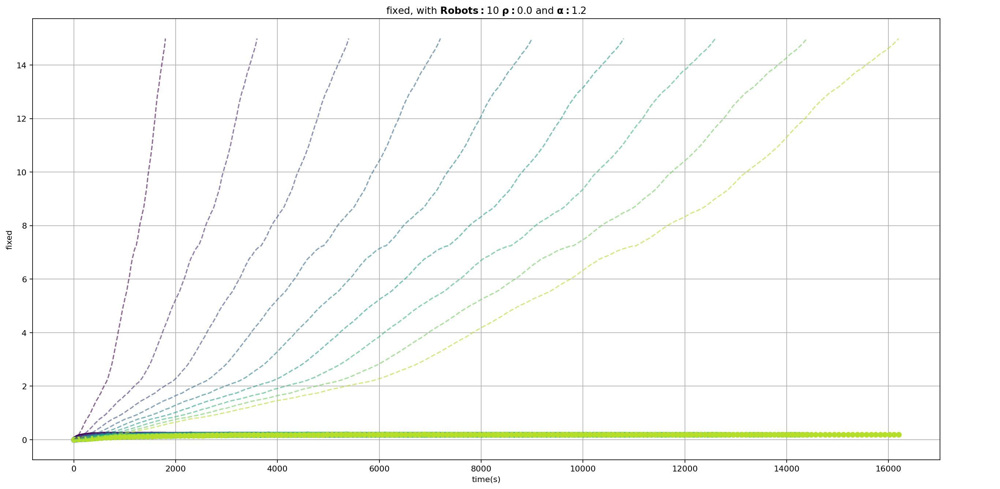

In [33]:
plot_both_wmsd(baseline, experiment)

In [49]:
main_folder = '/home/luigi/Documents/ARGoS/argos_results_scripts/LMCRW/results'
folder_experiments = 'random_angle_100_runs'
baseline_dir = '/home/luigi/Documents/ARGoS/argos_results_scripts/LMCRW/results/baseline/2021-10-13_robots#1_'
msd_type = 'fixed'
bin_edges = np.linspace(0, 0.45, 20)
result_time_dir = '/home/luigi/Documents/ARGoS/argos_results_scripts/LMCRW/results/Plots/random_angle_100_runs/fixed_window_displacement'


dirName = '/home/luigi/Documents/ARGoS/argos_results_scripts/LMCRW/results/random_angle_100_runs/2021-09-22_robots#10_alpha#1.2_rho#0.0_1800'
folder_baseline = '/home/luigi/Documents/ARGoS/argos_results_scripts/LMCRW/results/baseline/2021-10-13_robots#1_alpha#1.2_rho#0.0_baseline_1800'

In [50]:
def load_pd_positions(dirPath, experiment_type):
    if experiment_type != "experiment" and experiment_type != "baseline":
        print("experiment_type could be only $experiment or $baseline")
        exit(-1)

    num_experiment = len([name for name in os.listdir(dirPath) if
                          (os.path.isfile(os.path.join(dirPath, name)) and (name.endswith('position.tsv')))])

    if os.path.exists(dirPath + "/" + experiment_type + ".pkl"):
        return num_experiment, pd.read_pickle(dirPath + "/" + experiment_type + ".pkl")

    df = pd.DataFrame()
    for filename in os.listdir(dirPath):
        if filename.endswith('position.tsv'):
            if not os.path.getsize(os.path.join(dirPath, filename)) > 0:
                print("Error, empty file at:" + os.path.join(dirPath, filename))
                continue
            df_single = pd.read_csv(dirPath + "/" + filename, sep="\t")
            df = df.append(df_single)

    return num_experiment, df

In [77]:
print(colored('MSD Evaluation and/or Density Maps Generation ', 'blue'))

for dirName, subdirList, fileList in os.walk(main_folder + '/' + folder_experiments):

    num_robots = "-1"
    rho = -1.0
    alpha = -1.0
    elements = dirName.split("_")
    for e in elements:
        if e.startswith("robots"):
            num_robots = e.split("#")[-1]
        if e.startswith("rho"):
            rho = float(e.split("#")[-1])
        if e.startswith("alpha"):
            alpha = float(e.split("#")[-1])


    if num_robots == "-1" or rho == -1.0 or alpha == -1:
        continue

    print("dirName: ", dirName)
    print('#robots:' + num_robots + ' rho:' + str(rho) + ' alpha:' + str(alpha))
    runs = len([f for f in fileList if
                (os.path.isfile(os.path.join(dirName, f)) and f.endswith('position.tsv'))])
    print("# different runs: ", runs)

    rho_str = str(rho)
    alpha_str = str(alpha)
    # print("rho", rho_str)
    # print("alpha", alpha_str, end='\n\n')

    total_experiment_wmsd = []
    baseline_experiment_wmsd = []

    #     print(alpha_str)

    folder_baseline = baseline_dir + "alpha#%s_rho#%s_baseline_1800" % (alpha_str, rho_str)
    print(baseline_dir)
    print(folder_baseline)
    if not os.path.isdir(folder_baseline):
        print(colored('ERROR:folder_baseline is not an existing directory', 'red'))
        exit(-1)

    [number_of_experiments, df_experiment] = load_pd_positions(dirName, "experiment")
    [_, df_baseline] = load_pd_positions(folder_baseline, "baseline")

#     #     print(number_of_experiments)
    positions_concatenated = df_experiment.values[:, 1:]
    [num_robot, num_times] = positions_concatenated.shape
    positions_concatenated = np.array([x.split(',') for x in positions_concatenated.ravel()], dtype=float)
    positions_concatenated = positions_concatenated.reshape(num_robot, num_times, 2)
    #         print(positions_concatenated.shape)

    if True:
        print('\tComparison Plots')
        baseline_concatenated = df_baseline.values[:, 1:]
        [num_robot, num_times] = baseline_concatenated.shape
        baseline_concatenated = np.array([x.split(',') for x in baseline_concatenated.ravel()], dtype=float)
        baseline_concatenated = baseline_concatenated.reshape(num_robot, num_times, 2)

        for window_size in range(1, 10):
            w_displacement_array = np.array([])
            base_w_displacement_array = np.array([])

            if msd_type == 'windowed':
                base_win_disp = utils.window_displacement(baseline_concatenated, window_size)
                win_disp = utils.window_displacement(positions_concatenated, window_size)
            else:
                # win_disp = utils.fixed_window_displacement(positions_concatenated, window_size)
                # base_win_disp = utils.fixed_window_displacement(baseline_concatenated, window_size)
#                 win_disp = utils.time_mean_square_displacement(positions_concatenated)
#                 base_win_disp = utils.time_mean_square_displacement(baseline_concatenated)

            w_displacement_array = np.vstack(
                [w_displacement_array, win_disp]) if w_displacement_array.size else win_disp
            base_w_displacement_array = np.vstack(
                [base_w_displacement_array, base_win_disp]) if base_w_displacement_array.size else base_win_disp
            # mean_wmsd = win_disp.mean()

            total_experiment_wmsd.append(w_displacement_array)
            baseline_experiment_wmsd.append(base_w_displacement_array)

#         # utils.plot_both_wmsd(windowed, baseline_experiment_wmsd, total_experiment_wmsd, alpha_str, rho_str, num_robots,
#         #                     title, result_time_dir)


#         plot_both_wmsd(baseline_experiment_wmsd, total_experiment_wmsd, alpha_str, rho_str, num_robots,
#                              result_time_dir, msd_type)

MSD Evaluation and/or Density Maps Generation 
dirName:  /home/luigi/Documents/ARGoS/argos_results_scripts/LMCRW/results/random_angle_100_runs/2021-09-22_robots#10_alpha#1.2_rho#0.0_1800
#robots:10 rho:0.0 alpha:1.2
# different runs:  100
/home/luigi/Documents/ARGoS/argos_results_scripts/LMCRW/results/baseline/2021-10-13_robots#1_
/home/luigi/Documents/ARGoS/argos_results_scripts/LMCRW/results/baseline/2021-10-13_robots#1_alpha#1.2_rho#0.0_baseline_1800
	Comparison Plots


NameError: name 'utils' is not defined

In [52]:
number_of_experiments

100

In [56]:
df_experiment

,Robot id,t = 0,t = 100,t = 200,t = 300,t = 400,t = 500,t = 600,t = 700,t = 800,t = 900,t = 1000,t = 1100,t = 1200,t = 1300,t = 1400,t = 1500,t = 1600,t = 1700,t = 1800,t = 1900,t = 2000,t = 2100,t = 2200,t = 2300,t = 2400,t = 2500,t = 2600,t = 2700,t = 2800,t = 2900,t = 3000,t = 3100,t = 3200,t = 3300,t = 3400,t = 3500,t = 3600,t = 3700,t = 3800,t = 3900,t = 4000,t = 4100,t = 4200,t = 4300,t = 4400,t = 4500,t = 4600,t = 4700,t = 4800,t = 4900,t = 5000,t = 5100,t = 5200,t = 5300,t = 5400,t = 5500,t = 5600,t = 5700,t = 5800,t = 5900,t = 6000,t = 6100,t = 6200,t = 6300,t = 6400,t = 6500,t = 6600,t = 6700,t = 6800,t = 6900,t = 7000,t = 7100,t = 7200,t = 7300,t = 7400,t = 7500,t = 7600,t = 7700,t = 7800,t = 7900,t = 8000,t = 8100,t = 8200,t = 8300,t = 8400,t = 8500,t = 8600,t = 8700,t = 8800,t = 8900,t = 9000,t = 9100,t = 9200,t = 9300,t = 9400,t = 9500,t = 9600,t = 9700,t = 9800,t = 9900,t = 10000,t = 10100,t = 10200,t = 10300,t = 10400,t = 10500,t = 10600,t = 10700,t = 10800,t = 10900,t = 11000,t = 11100,t = 11200,t = 11300,t = 11400,t = 11500,t = 11600,t = 11700,t = 11800,t = 11900,t = 12000,t = 12100,t = 12200,t = 12300,t = 12400,t = 12500,t = 12600,t = 12700,t = 12800,t = 12900,t = 13000,t = 13100,t = 13200,t = 13300,t = 13400,t = 13500,t = 13600,t = 13700,t = 13800,t = 13900,t = 14000,t = 14100,t = 14200,t = 14300,t = 14400,t = 14500,t = 14600,t = 14700,t = 14800,t = 14900,t = 15000,t = 15100,t = 15200,t = 15300,t = 15400,t = 15500,t = 15600,t = 15700,t = 15800,t = 15900,t = 16000,t = 16100,t = 16200,t = 16300,t = 16400,t = 16500,t = 16600,t = 16700,t = 16800,t = 16900,t = 17000,t = 17100,t = 17200,t = 17300,t = 17400,t = 17500,t = 17600,t = 17700,t = 17800,t = 17900,t = 18000
0,0,"0.279,-0.231","0.295,-0.168","0.354,-0.094","0.367,0.002","0.385,0.101","0.413,0.079","0.428,-0.003","0.355,-0.068","0.348,-0.145","0.291,-0.088","0.266,-0.004","0.223,0.086","0.180,0.176","0.136,0.266","0.096,0.353","0.066,0.420","0.116,0.410","0.072,0.359","0.001,0.340","0.027,0.330","0.058,0.251","0.108,0.178","0.050,0.218","0.055,0.216","-0.021,0.202","-0.054,0.255","-0.009,0.319","-0.043,0.249","-0.110,0.203","-0.157,0.115","-0.215,0.059","-0.200,0.084","-0.187,0.116","-0.137,0.103","-0.056,0.105","0.022,0.047","0.051,0.142","0.130,0.159","0.223,0.155","0.164,0.123","0.138,0.038","0.123,0.054","0.074,0.070","0.011,0.147","0.026,0.224","0.048,0.312","0.083,0.377","0.121,0.422","0.155,0.407","0.095,0.357","0.114,0.271","0.161,0.262","0.216,0.243","0.232,0.212","0.296,0.279","0.262,0.279","0.245,0.348","0.154,0.368","0.202,0.360","0.213,0.318","0.163,0.379","0.165,0.371","0.177,0.314","0.152,0.218","0.136,0.133","0.078,0.128","0.049,0.176","-0.012,0.235","-0.048,0.328","-0.028,0.393","-0.019,0.376","0.017,0.289","0.072,0.258","0.095,0.242","0.015,0.267","0.094,0.274","0.106,0.221","0.037,0.186","0.000,0.242","0.005,0.179","0.011,0.126","-0.065,0.137","-0.037,0.174","0.057,0.141","0.151,0.108","0.234,0.066","0.267,0.071","0.293,0.161","0.260,0.188","0.229,0.195","0.281,0.226","0.193,0.190","0.110,0.201","0.094,0.113","0.151,0.149","0.180,0.237","0.139,0.197","0.075,0.258","0.121,0.225","0.049,0.226","-0.018,0.264","0.018,0.312","0.033,0.240","0.046,0.256","0.103,0.318","0.115,0.405","0.129,0.366","0.069,0.366","0.040,0.398","0.083,0.426","0.116,0.415","0.170,0.342","0.157,0.260","0.132,0.341","0.200,0.356","0.173,0.262","0.189,0.215","0.142,0.215","0.108,0.161","0.143,0.067","0.183,0.040","0.281,0.061","0.330,0.040","0.363,0.027","0.319,0.023","0.363,0.002","0.271,-0.022","0.297,-0.031","0.289,-0.116","0.303,-0.194","0.333,-0.257","0.257,-0.317","0.248,-0.280","0.222,-0.184","0.259,-0.147","0.358,-0.152","0.353,-0.229","0.382,-0.139","0.291,-0.118","0.230,-0.080","0.318,-0.086","0.404,-0.122","0.339,-0.134","0.382,-0.093","0.382,-0.156","0.345,-0.218","0.299,-0.144","0.229,-0.072","0.160,0.001","0.091,0.073","0.022,0.145","-0.047,0.217","-0.116,0.290","-0.185,0.362","-0.208,0.292","-0.250,0.212","-0.317,0.137","-0.381,0.065","-0.398,-0.014","-0.4

In [55]:
df_experiment.shape

(1000, 182)

In [58]:
print(positions_concatenated.shape)

(1000, 181, 2)


In [72]:
positions_concatenated[0,:,1]

array([-0.231, -0.168, -0.094, 0.002, 0.101, 0.079, -0.003, -0.068, -0.145, -0.088, -0.004, 0.086, 0.176, 0.266, 0.353, 0.42, 0.41, 0.359, 0.34, 0.33, 0.251, 0.178, 0.218, 0.216, 0.202, 0.255, 0.319, 0.249, 0.203, 0.115, 0.059, 0.084, 0.116, 0.103, 0.105, 0.047, 0.142, 0.159, 0.155, 0.123, 0.038, 0.054, 0.07, 0.147, 0.224, 0.312, 0.377, 0.422, 0.407, 0.357, 0.271, 0.262, 0.243, 0.212, 0.279, 0.279, 0.348, 0.368, 0.36, 0.318, 0.379, 0.371, 0.314, 0.218, 0.133, 0.128, 0.176, 0.235, 0.328, 0.393, 0.376, 0.289, 0.258, 0.242, 0.267, 0.274, 0.221, 0.186, 0.242, 0.179, 0.126, 0.137, 0.174, 0.141, 0.108, 0.066, 0.071, 0.161, 0.188, 0.195, 0.226, 0.19, 0.201, 0.113, 0.149, 0.237, 0.197, 0.258, 0.225, 0.226, 0.264, 0.312, 0.24, 0.256, 0.318, 0.405, 0.366, 0.366, 0.398, 0.426, 0.415, 0.342, 0.26, 0.341, 0.356, 0.262, 0.215, 0.215, 0.161, 0.067, 0.04, 0.061, 0.04, 0.027, 0.023, 0.002, -0.022, -0.031, -0.116, -0.194, -0.257, -0.317, -0.28, -0.184, -0.147, -0.152, -0.229, -0.139, -0.118, -0.08, -0.0

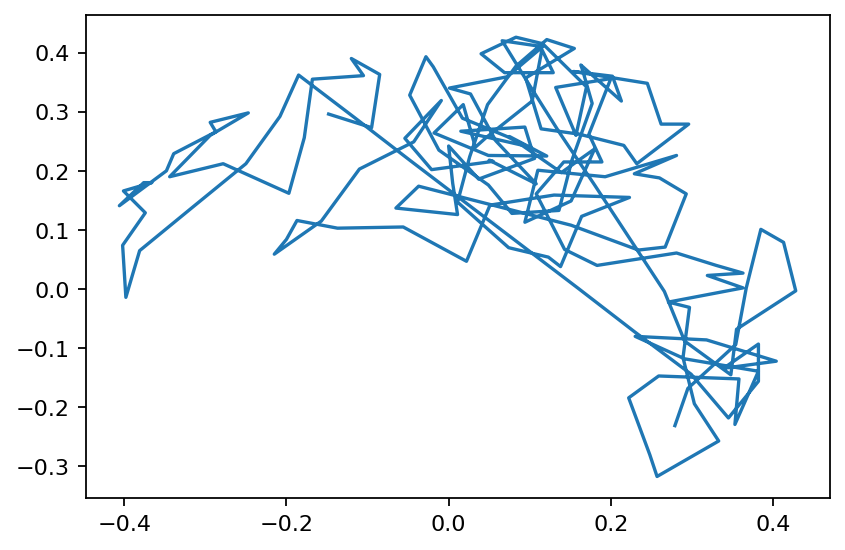

In [75]:
import numpy as np
import matplotlib.pyplot as plt

N = 50
x = positions_concatenated[0,:,0]
y = positions_concatenated[0,:,1]

fig = plt.figure(dpi=160)
plt.plot(x, y)
plt.show()
